# Imports & Libraries

In [58]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import scipy.stats as stats
from sklearn.preprocessing import LabelEncoder, RobustScaler
import scipy
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE, chi2, SelectKBest
from imblearn.over_sampling import SMOTE, RandomOverSampler
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB

# Helper Functions

In [59]:
# Single feature partial dependence plot
def pdp(feature_of_interest, test_data, model, title='', ylabel='', xlabel='', xlim=(0, 10)):
    # define parameters for the plot
    isolated = pdp_isolate(
        model = model,
        dataset = test_data,
        model_features = test_data.columns,
        feature = feature_of_interest,
        num_grid_points =  100
    )
    
    # plot isolated features
    pdp_plot(isolated, feature_name=feature_of_interest)
    plt.xlim(xlim)
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

In [60]:
# Distribution plot
def distribution_plot(data):
    sns.displot(data, kind='hist', kde=True)
    plt.ylabel('Frequency')
    plt.title(f'{data.name} distribution')

In [61]:
# Functions for box plots 
def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    x=plt.xticks(rotation=90)

def fillMissingCatColumns(data,categorical):
    for c in categorical:
        data[c] = data[c].astype('category')
        if data[c].isnull().any():
            data[c] = data[c].cat.add_categories(['MISSING'])
            data[c] = data[c].fillna('MISSING')
    
def getboxPlots(data,var,categorical):
    fillMissingCatColumns(data,categorical)
    f = pd.melt(data, id_vars=var, value_vars=categorical)
    g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, height=5)
    g = g.map(boxplot, "value", var)

In [62]:
# Correlation Heatmap
def getCorrHeatMap(dataFrame,figSize=[12,9]):
    corrmat = dataFrame.corr()
    f, ax = plt.subplots(figsize=(figSize[0], figSize[1]))
    sns.heatmap(corrmat, vmax=.8, square=True);
    


def getZoomedCorrHeatMap(dataFrame,featureCount,target,figSize=[12,9]):
    corrmat = dataFrame.corr()
    cols = corrmat.nlargest(featureCount, target)[target].index
    f , ax = plt.subplots(figsize = (figSize[0],figSize[1]))
    cm = np.corrcoef(dataFrame[cols].values.T)
    sns.set(font_scale=1.25)
    hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
    plt.show()

In [63]:
# Mahalanobis function outlier detection
def mahalanobis(x=None, data=None, cov=None):
    x_minus_mu = x - np.mean(data)
    if not cov:
        cov = np.cov(data.values.T)
    inv_covmat = scipy.linalg.inv(cov)
    left_term = np.dot(x_minus_mu, inv_covmat)
    mahal = np.dot(left_term, x_minus_mu.T)
    return mahal.diagonal()

In [64]:
# PCA plot function
def plot_variance(pca, width=8, dpi=100):
    # Create figure
    fig, axs = plt.subplots(1, 2)
    n = pca.n_components_
    grid = np.arange(1, n + 1)
    # Explained variance
    evr = pca.explained_variance_ratio_
    axs[0].bar(grid, evr)
    axs[0].set(
        xlabel="Component", title="% Explained Variance", ylim=(0.0, 1.0)
    )
    # Cumulative Variance
    cv = np.cumsum(evr)
    axs[1].plot(np.r_[0, grid], np.r_[0, cv], "o-")
    axs[1].set(
        xlabel="Component", title="% Cumulative Variance", ylim=(0.0, 1.0)
    )
    # Set up figure
    fig.set(figwidth=8, dpi=100)
    return axs

# Loading Data 

In [65]:
from sklearn.datasets import make_classification


X, y = make_classification(n_samples=600, n_features=14, n_informative=5, n_classes=3, hypercube=True)

data = pd.DataFrame(X)
data['label'] = y
data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,label
0,1.556824,-1.882531,1.150108,-0.312076,1.290657,-2.344955,-0.978071,-1.650328,0.096866,-0.747586,1.293287,-0.807057,0.657319,-1.562738,2
1,2.640640,1.108762,-1.564419,0.879403,-0.047671,0.009207,-0.875733,-0.162473,-0.729947,2.489704,-1.808861,-1.037136,1.544674,-1.697376,0
2,2.390189,1.903828,1.424123,-1.309247,-0.985397,1.511522,-1.505403,0.399057,-0.112748,-1.823488,-0.074488,-0.938681,-0.111125,-0.696762,2
3,0.380224,-0.215363,1.325002,1.352795,0.130119,1.079269,-1.465290,-1.174600,0.367490,-2.778684,0.898671,0.240761,-2.173264,-0.487422,2
4,2.640780,-0.745936,1.016147,-1.260485,0.061986,0.506494,-2.176923,-0.449094,-1.735528,-0.458998,1.482973,-0.663875,0.588694,-2.192379,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-2.500142,-1.878032,2.344990,-0.756310,1.123016,-1.049428,0.013234,1.159368,0.492901,-3.779405,0.542624,0.264204,-1.655568,1.751105,0
596,0.868540,-0.297579,1.161280,-0.741735,1.145438,-0.414433,0.052880,-1.181933,-0.752548,-1.199155,-0.471567,2.160249,-2.080752,-1.878595,2
597,2.098122,2.017270,-1.249699,-0.777536,0.810141,1.208505,-0.879687,-1.342118,1.826302,1.998017,0.271684,0.238152,0.460515,-1.431624,0
598,-1.272742,0.914778,2.583839,-0.420005,-0.651712,-1.559703,0.206331,0.455645,-2.511475,-6.652870,0.896097,-2.803675,-2.502737,3.155374,1


In [66]:
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,label
0,1.556824,-1.882531,1.150108,-0.312076,1.290657,-2.344955,-0.978071,-1.650328,0.096866,-0.747586,1.293287,-0.807057,0.657319,-1.562738,2
1,2.640640,1.108762,-1.564419,0.879403,-0.047671,0.009207,-0.875733,-0.162473,-0.729947,2.489704,-1.808861,-1.037136,1.544674,-1.697376,0
2,2.390189,1.903828,1.424123,-1.309247,-0.985397,1.511522,-1.505403,0.399057,-0.112748,-1.823488,-0.074488,-0.938681,-0.111125,-0.696762,2
3,0.380224,-0.215363,1.325002,1.352795,0.130119,1.079269,-1.465290,-1.174600,0.367490,-2.778684,0.898671,0.240761,-2.173264,-0.487422,2
4,2.640780,-0.745936,1.016147,-1.260485,0.061986,0.506494,-2.176923,-0.449094,-1.735528,-0.458998,1.482973,-0.663875,0.588694,-2.192379,1


In [67]:
data.columns


Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 'label'], dtype='object')

# Data Exploration

## Univariate Exploration

Numerical Variables

In [68]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,600.0,0.735036,1.703092,-4.691064,-0.391974,0.776544,1.879580,5.822181
1,600.0,-0.288954,1.532406,-4.761813,-1.328175,-0.369441,0.717302,4.520254
2,600.0,0.689344,1.329981,-3.205291,-0.079491,0.822362,1.527673,4.803239
3,600.0,-0.050455,0.977338,-3.503288,-0.691683,-0.040569,0.589506,2.866880
4,600.0,-0.008767,0.942506,-2.690585,-0.658555,-0.044492,0.632879,3.304541
5,600.0,-0.018106,1.000625,-2.629588,-0.712068,-0.024363,0.667013,3.712418
6,600.0,-0.006890,1.018347,-2.663926,-0.722351,0.021531,0.688236,2.817210
7,600.0,-0.029457,0.967266,-2.602788,-0.681779,0.006576,0.578822,3.159692
8,600.0,-0.047413,0.947543,-3.016123,-0.675378,-0.033402,0.535320,3.073511
9,600.0,-0.659873,2.225565,-7.918856,-2.097754,-0.692584,0.734374,6.543168


Distributions, Skewness & Kurtosis 

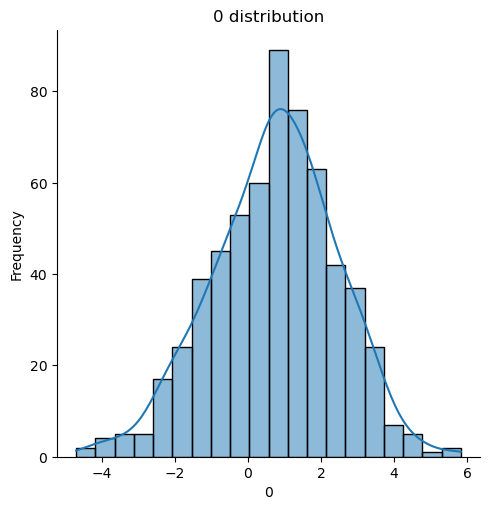

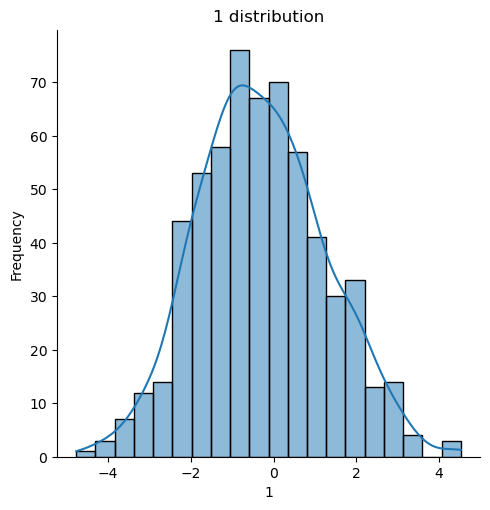

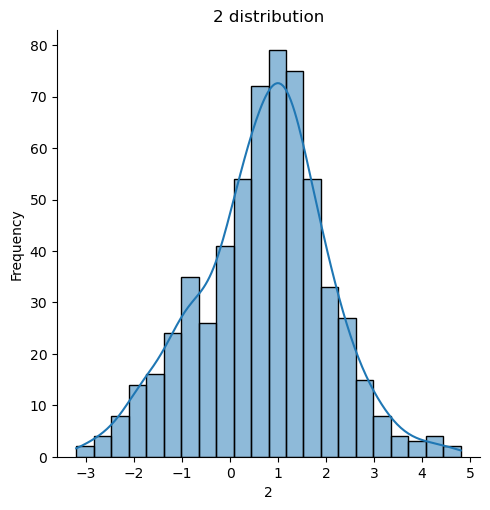

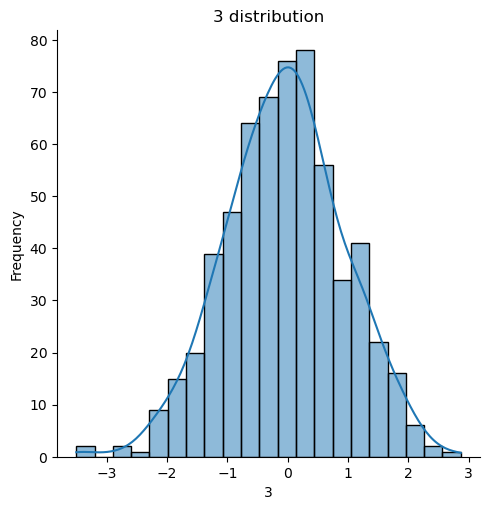

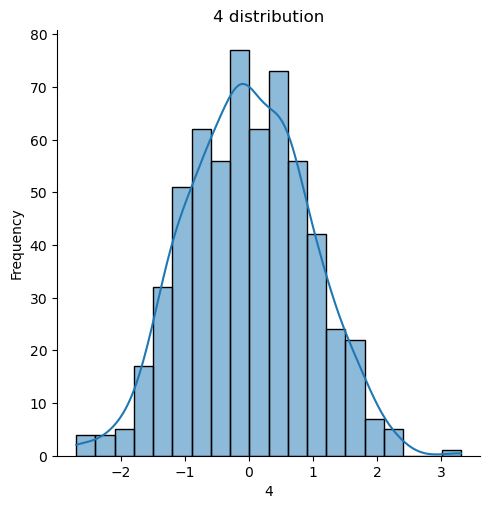

...

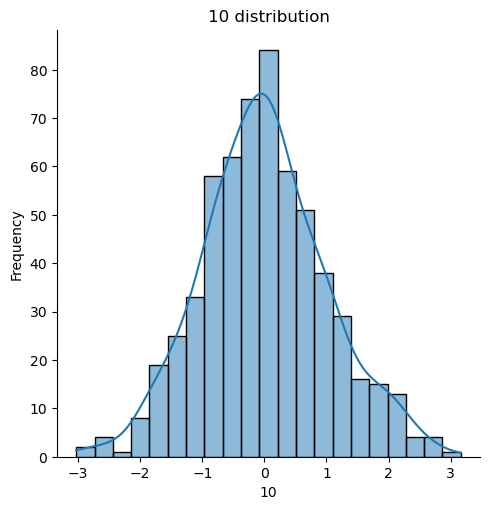

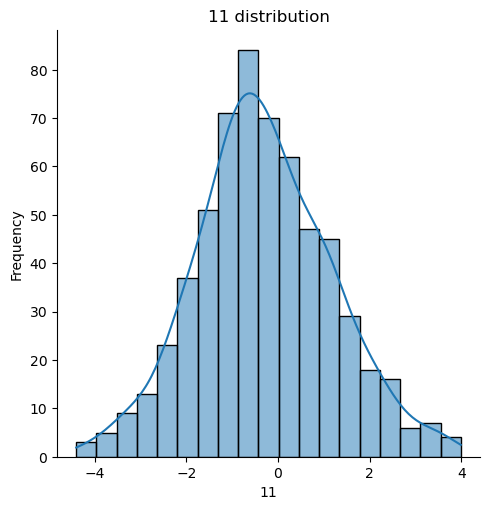

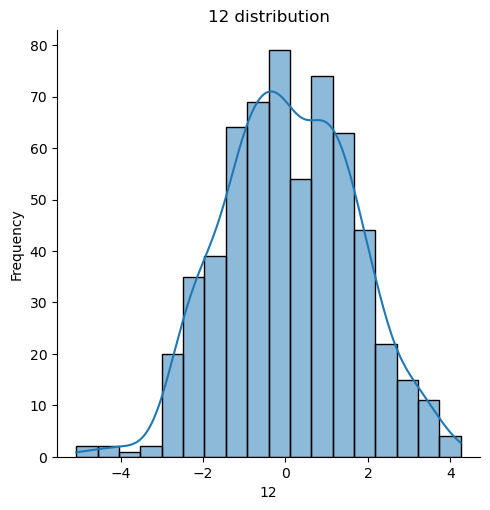

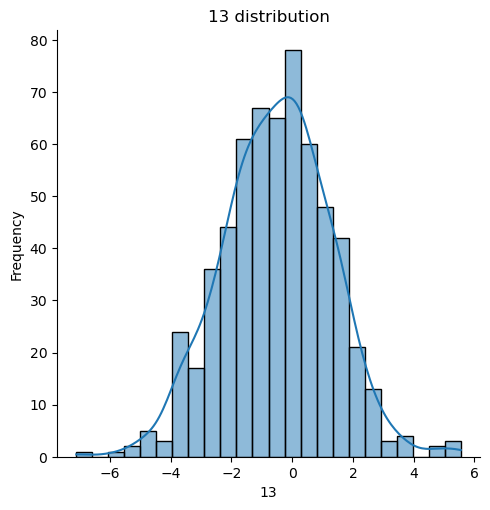

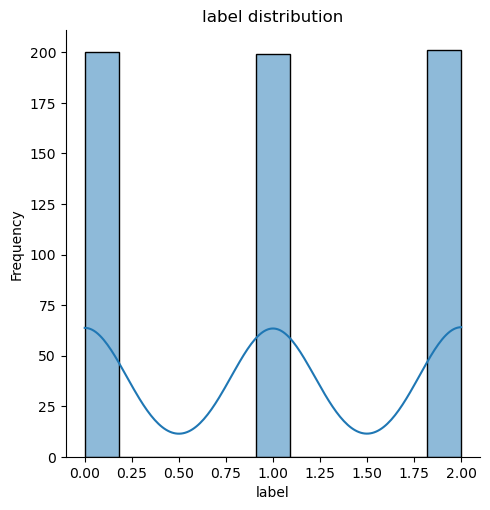

In [69]:
for i in data.columns:
    distribution_plot(data[i])

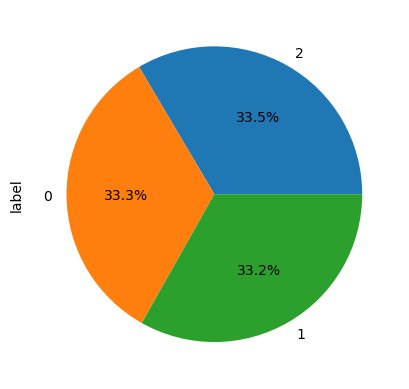

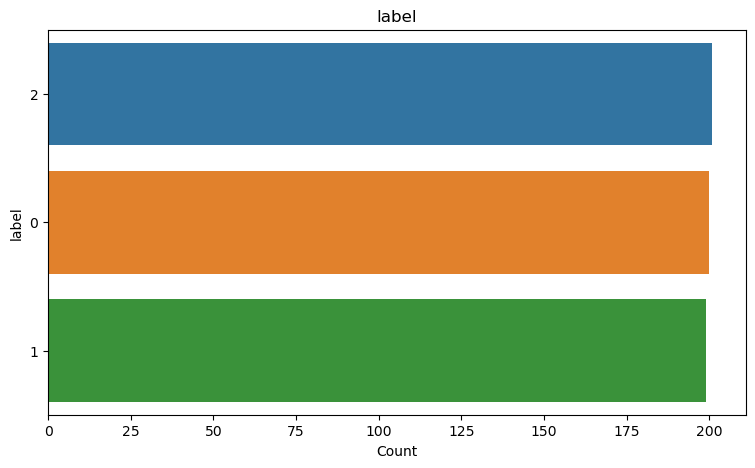

In [70]:
# pie plot
data['label'].value_counts().plot(kind='pie', autopct='%1.1f%%')

# bar chart
order = data['label'].value_counts().index
plt.figure(figsize=(9, 5))
sns.countplot(data=data, y='label', order=order)
plt.title('label')
plt.xlabel('Count')
plt.ylabel('label');

## Bivariate Exploration

Numerical-Numerical

array([[<Axes: xlabel='0', ylabel='0'>, <Axes: xlabel='1', ylabel='0'>,
        <Axes: xlabel='2', ylabel='0'>, <Axes: xlabel='3', ylabel='0'>,
        <Axes: xlabel='4', ylabel='0'>, <Axes: xlabel='5', ylabel='0'>,
        <Axes: xlabel='6', ylabel='0'>, <Axes: xlabel='7', ylabel='0'>,
        <Axes: xlabel='8', ylabel='0'>, <Axes: xlabel='9', ylabel='0'>,
        <Axes: xlabel='10', ylabel='0'>, <Axes: xlabel='11', ylabel='0'>,
        <Axes: xlabel='12', ylabel='0'>, <Axes: xlabel='13', ylabel='0'>,
        <Axes: xlabel='label', ylabel='0'>],
       [<Axes: xlabel='0', ylabel='1'>, <Axes: xlabel='1', ylabel='1'>,
        <Axes: xlabel='2', ylabel='1'>, <Axes: xlabel='3', ylabel='1'>,
        <Axes: xlabel='4', ylabel='1'>, <Axes: xlabel='5', ylabel='1'>,
        <Axes: xlabel='6', ylabel='1'>, <Axes: xlabel='7', ylabel='1'>,
        <Axes: xlabel='8', ylabel='1'>, <Axes: xlabel='9', ylabel='1'>,
        <Axes: xlabel='10', ylabel='1'>, <Axes: xlabel='11', ylabel='1'>,
        <Axes

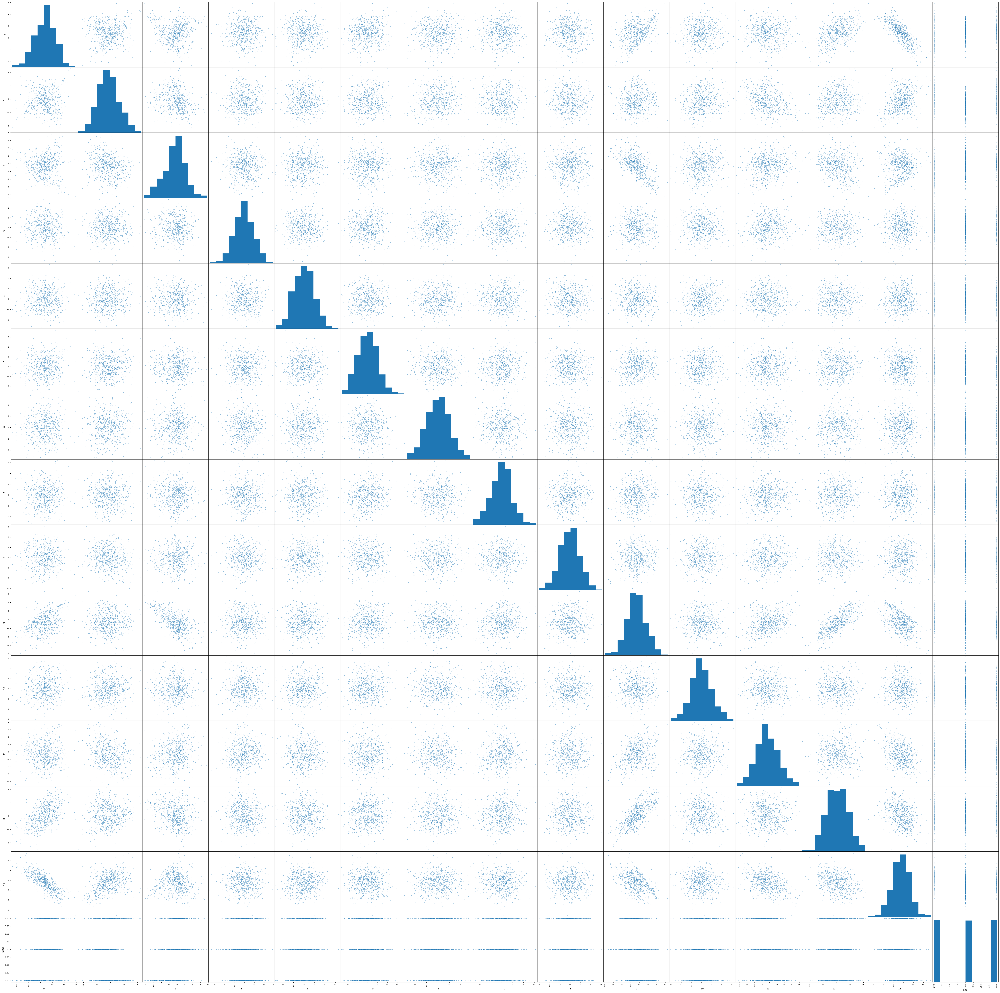

In [71]:
pd.plotting.scatter_matrix(data, figsize=(75,75), grid=True)

# Data Preprocessing

In [72]:
data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,label
0,1.556824,-1.882531,1.150108,-0.312076,1.290657,-2.344955,-0.978071,-1.650328,0.096866,-0.747586,1.293287,-0.807057,0.657319,-1.562738,2
1,2.640640,1.108762,-1.564419,0.879403,-0.047671,0.009207,-0.875733,-0.162473,-0.729947,2.489704,-1.808861,-1.037136,1.544674,-1.697376,0
2,2.390189,1.903828,1.424123,-1.309247,-0.985397,1.511522,-1.505403,0.399057,-0.112748,-1.823488,-0.074488,-0.938681,-0.111125,-0.696762,2
3,0.380224,-0.215363,1.325002,1.352795,0.130119,1.079269,-1.465290,-1.174600,0.367490,-2.778684,0.898671,0.240761,-2.173264,-0.487422,2
4,2.640780,-0.745936,1.016147,-1.260485,0.061986,0.506494,-2.176923,-0.449094,-1.735528,-0.458998,1.482973,-0.663875,0.588694,-2.192379,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,-2.500142,-1.878032,2.344990,-0.756310,1.123016,-1.049428,0.013234,1.159368,0.492901,-3.779405,0.542624,0.264204,-1.655568,1.751105,0
596,0.868540,-0.297579,1.161280,-0.741735,1.145438,-0.414433,0.052880,-1.181933,-0.752548,-1.199155,-0.471567,2.160249,-2.080752,-1.878595,2
597,2.098122,2.017270,-1.249699,-0.777536,0.810141,1.208505,-0.879687,-1.342118,1.826302,1.998017,0.271684,0.238152,0.460515,-1.431624,0
598,-1.272742,0.914778,2.583839,-0.420005,-0.651712,-1.559703,0.206331,0.455645,-2.511475,-6.652870,0.896097,-2.803675,-2.502737,3.155374,1


In [73]:
data.insert(0,'label2','')
data['label2'] = data['label'] 

In [74]:
data.pop('label')

0      2
1      0
2      2
3      2
4      1
      ..
595    0
596    2
597    0
598    1
599    0
Name: label, Length: 600, dtype: int32

In [75]:
data = data.rename(columns={'label2':'label'})

In [76]:
data

,label,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,2,1.556824,-1.882531,1.150108,-0.312076,1.290657,-2.344955,-0.978071,-1.650328,0.096866,-0.747586,1.293287,-0.807057,0.657319,-1.562738
1,0,2.640640,1.108762,-1.564419,0.879403,-0.047671,0.009207,-0.875733,-0.162473,-0.729947,2.489704,-1.808861,-1.037136,1.544674,-1.697376
2,2,2.390189,1.903828,1.424123,-1.309247,-0.985397,1.511522,-1.505403,0.399057,-0.112748,-1.823488,-0.074488,-0.938681,-0.111125,-0.696762
3,2,0.380224,-0.215363,1.325002,1.352795,0.130119,1.079269,-1.465290,-1.174600,0.367490,-2.778684,0.898671,0.240761,-2.173264,-0.487422
4,1,2.640780,-0.745936,1.016147,-1.260485,0.061986,0.506494,-2.176923,-0.449094,-1.735528,-0.458998,1.482973,-0.663875,0.588694,-2.192379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,0,-2.500142,-1.878032,2.344990,-0.756310,1.123016,-1.049428,0.013234,1.159368,0.492901,-3.779405,0.542624,0.264204,-1.655568,1.751105
596,2,0.868540,-0.297579,1.161280,-0.741735,1.145438,-0.414433,0.052880,-1.181933,-0.752548,-1.199155,-0.471567,2.160249,-2.080752,-1.878595
597,0,2.098122,2.017270,-1.249699,-0.777536,0.810141,1.208505,-0.879687,-1.342118,1.826302,1.998017,0.271684,0.238152,0.460515,-1.431624
598,1,-1.272742,0.914778,2.583839,-0.420005,-0.651712,-1.559703,0.206331,0.455645,-2.511475,-6.652870,0.896097,-2.803675,-2.502737,3.155374


## Checking Missing Values

In [77]:
data.isnull().sum()


label    0
0        0
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
dtype: int64

## Outlier Detection

Mahalanobis Distance - Multivariate Outlier Detection

In [78]:
df = data[['label', 0,1,2,3,4,5,6,7,8,9,10,11,12,13]]

df['mahalanobis'] = mahalanobis(x=df, data=data[['label', 0,1,2,3,4,5,6,7,8,9,10,11,12,13]])

In [79]:
df.head()

,label,0,1,2,3,4,5,6,7,8,9,10,11,12,13,mahalanobis
0,2,1.556824,-1.882531,1.150108,-0.312076,1.290657,-2.344955,-0.978071,-1.650328,0.096866,-0.747586,1.293287,-0.807057,0.657319,-1.562738,15.829413
1,0,2.640640,1.108762,-1.564419,0.879403,-0.047671,0.009207,-0.875733,-0.162473,-0.729947,2.489704,-1.808861,-1.037136,1.544674,-1.697376,11.461341
2,2,2.390189,1.903828,1.424123,-1.309247,-0.985397,1.511522,-1.505403,0.399057,-0.112748,-1.823488,-0.074488,-0.938681,-0.111125,-0.696762,12.249871
3,2,0.380224,-0.215363,1.325002,1.352795,0.130119,1.079269,-1.465290,-1.174600,0.367490,-2.778684,0.898671,0.240761,-2.173264,-0.487422,12.136843
4,1,2.640780,-0.745936,1.016147,-1.260485,0.061986,0.506494,-2.176923,-0.449094,-1.735528,-0.458998,1.482973,-0.663875,0.588694,-2.192379,13.576192


Chi Squared Test - Finding Outlier Rows

In [80]:
from scipy.stats import chi2
df['p'] = 1 - chi2.cdf(df['mahalanobis'], 16)

In [81]:
df

,label,0,1,2,3,4,5,6,7,8,9,10,11,12,13,mahalanobis,p
0,2,1.556824,-1.882531,1.150108,-0.312076,1.290657,-2.344955,-0.978071,-1.650328,0.096866,-0.747586,1.293287,-0.807057,0.657319,-1.562738,15.829413,0.464929
1,0,2.640640,1.108762,-1.564419,0.879403,-0.047671,0.009207,-0.875733,-0.162473,-0.729947,2.489704,-1.808861,-1.037136,1.544674,-1.697376,11.461341,0.780154
2,2,2.390189,1.903828,1.424123,-1.309247,-0.985397,1.511522,-1.505403,0.399057,-0.112748,-1.823488,-0.074488,-0.938681,-0.111125,-0.696762,12.249871,0.726607
3,2,0.380224,-0.215363,1.325002,1.352795,0.130119,1.079269,-1.465290,-1.174600,0.367490,-2.778684,0.898671,0.240761,-2.173264,-0.487422,12.136843,0.734507
4,1,2.640780,-0.745936,1.016147,-1.260485,0.061986,0.506494,-2.176923,-0.449094,-1.735528,-0.458998,1.482973,-0.663875,0.588694,-2.192379,13.576192,0.630254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595,0,-2.500142,-1.878032,2.344990,-0.756310,1.123016,-1.049428,0.013234,1.159368,0.492901,-3.779405,0.542624,0.264204,-1.655568,1.751105,13.291070,0.651368
596,2,0.868540,-0.297579,1.161280,-0.741735,1.145438,-0.414433,0.052880,-1.181933,-0.752548,-1.199155,-0.471567,2.160249,-2.080752,-1.878595,14.112172,0.590357
597,0,2.098122,2.017270,-1.249699,-0.777536,0.810141,1.208505,-0.879687,-1.342118,1.826302,1.998017,0.271684,0.238152,0.460515,-1.431624,17.488567,0.354683
598,1,-1.272742,0.914778,2.583839,-0.420005,-0.651712,-1.559703,0.206331,0.455645,-2.511475,-6.652870,0.896097,-2.803675,-2.502737,3.155374,20.072062,0.216993


In [82]:
outliers = df.loc[df['p'] < 0.05]

In [83]:
outliers.count()

label          11
0              11
1              11
2              11
3              11
4              11
5              11
6              11
7              11
8              11
9              11
10             11
11             11
12             11
13             11
mahalanobis    11
p              11
dtype: int64

Analysis of Outliers - 22 Outliers

Class 0 - 3 outliers detected

Class 1 - 7 outliers detected

Class 3 - 12 outliers detected

In [84]:
outliers

,label,0,1,2,3,4,5,6,7,8,9,10,11,12,13,mahalanobis,p
72,2,3.805039,2.597318,1.239150,-0.568006,1.117583,2.091473,1.803175,-0.944544,0.938728,-3.228198,2.336618,-2.413780,-1.180558,-1.194047,26.301761,0.049927
120,0,2.965512,-1.193934,-2.838437,-0.298925,0.947804,-0.684287,2.632849,-2.425028,-0.613061,2.647447,-0.590390,-4.198962,2.472334,-1.710332,33.464081,0.006411
138,1,-0.547218,-4.761813,1.342723,-0.758677,0.320739,-2.578218,-0.813052,1.468353,-0.866978,-4.137539,-1.120969,1.421886,-5.073638,-2.370395,32.898911,0.007621
186,2,-1.247468,1.927845,-0.827634,-0.028654,-0.598638,0.547771,-2.572688,1.011915,-2.435881,1.780429,0.424021,0.604626,1.180007,1.639559,30.097382,0.017504
227,1,0.214882,0.106301,0.670472,-1.806680,-1.056611,2.452960,-0.369676,0.683819,0.434315,1.684679,3.162396,3.102355,0.387439,-1.388138,27.807866,0.033331
235,2,4.434391,4.488088,0.168153,0.131707,0.229916,2.878529,-1.843131,1.222243,-1.985388,1.290039,1.825406,-0.805485,1.921768,-1.634781,30.638590,0.014959
364,2,5.095264,4.520254,1.307262,-1.178428,1.639650,2.039043,-0.805703,-0.586797,-1.299390,1.316261,1.088100,-0.156613,2.721367,-2.207524,27.404470,0.037201
435,2,2.559491,-0.653372,2.612971,-0.584530,-0.444460,0.374905,-1.730851,2.881144,1.556572,2.299666,0.521671,1.663384,4.250857,-2.430109,27.066046,0.040755
450,0,5.822181,0.892712,-3.205291,0.805203,0.977249,0.481173,1.396825,0.205236,-0.252262,5.691270,0.275494,2.910368,-0.500035,-7.108450,34.125945,0.005225
473,1,-0.561701,-1.893034,-0.756211,-1.962876,1.342325,2.090076,-1.463459,0.160714,0.250242,3.805345,2.636244,1.240755,2.831440,-0.722397,31.610651,0.011233


# Feature Selection

In [85]:
feature_cols = [0,1,2,3,4,5,6,7,8,9,10,11,12,13]

## Random Forest Feature Importance

In [86]:
X = data.iloc[:, 1:]
y = data.iloc[:, 0]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=21)

In [87]:
rf = RandomForestClassifier()

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.92      0.87      0.89        38
           1       0.77      0.64      0.70        47
           2       0.58      0.74      0.65        35

    accuracy                           0.74       120
   macro avg       0.75      0.75      0.75       120
weighted avg       0.76      0.74      0.75       120



<Axes: >

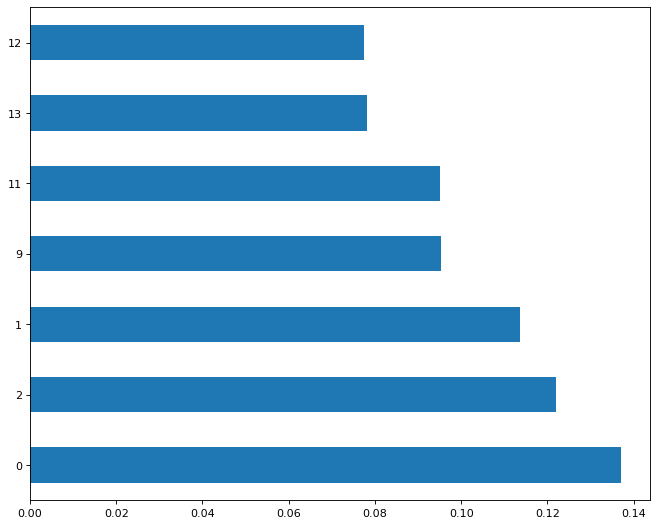

In [88]:
plt.figure(num=None, figsize=(10,8), dpi=80, facecolor='w', edgecolor='k')

feat_importances = pd.Series(rf.feature_importances_, index= feature_cols)

feat_importances.nlargest(7).plot(kind='barh')

Top 3 Correlations with label:
- Phy 
- Chem 
- Alevel math 

All 3 have a major impact on major of choice

Bottom 3 Correlations with label:
- Multicollinearity of numeric features 

## Correlation Matrix (NOT DONE)

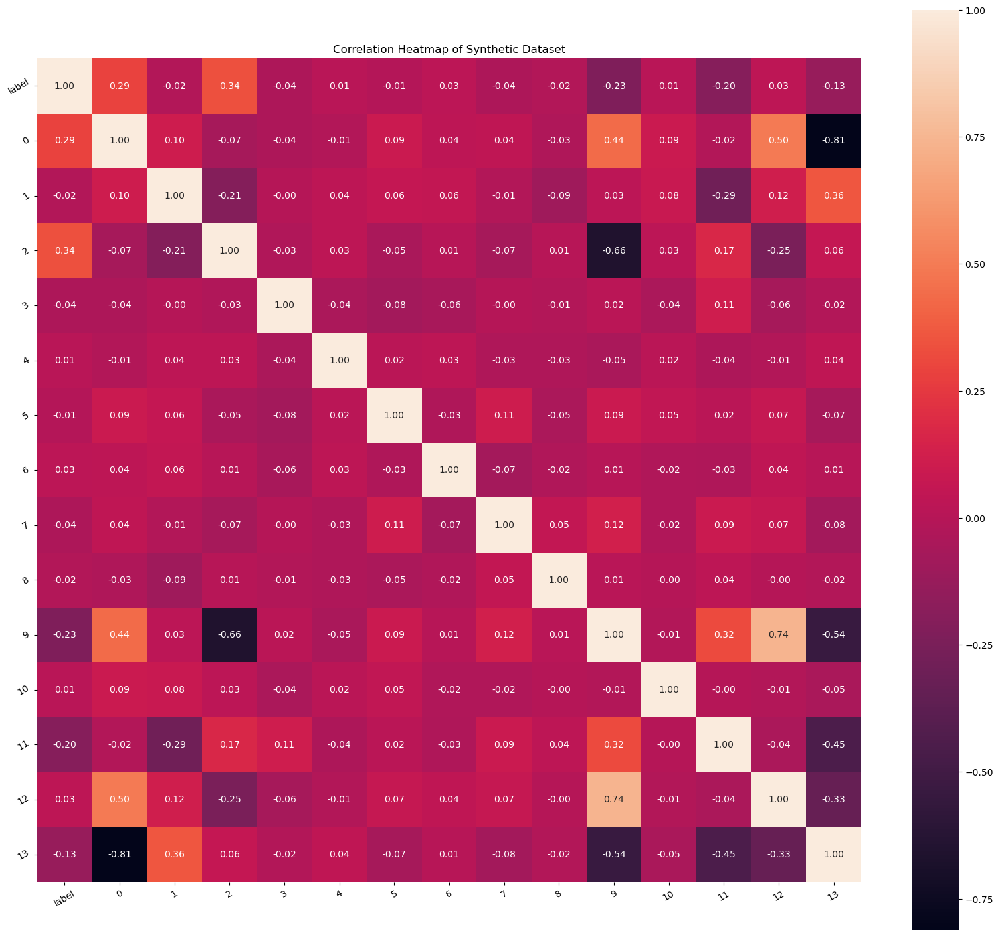

In [89]:
corr_matrix = data.corr(min_periods=2)

plt.figure(figsize=(20,18))
plt.title('Correlation Heatmap of Synthetic Dataset')
a = sns.heatmap(corr_matrix, square=True, annot=True, fmt='.2f', linecolor='black', mask=False)
a.set_xticklabels(a.get_xticklabels(), rotation=30)
a.set_yticklabels(a.get_yticklabels(), rotation=30)           
plt.show() 

## PCA

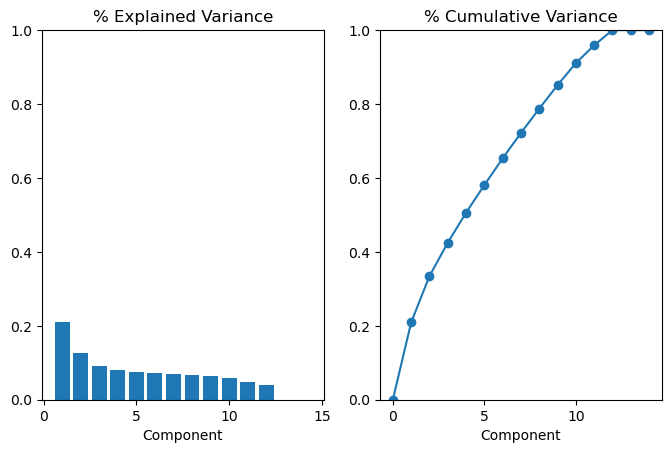

In [90]:
from sklearn.decomposition import PCA

#scaling
X_scaled = (X - X.mean(axis=0)) / X.std(axis=0)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

plot_variance(pca);

# Data Augmentation (NO NEED)

# Model & Knowledge Fusion

Models: RF, DT, Gaussian NB, Soft Voting Classifier (RF, DT, GNB), Soft Voting Classifier (RF, BNB, GNB) 

# Hyperparameter Optimization

In [91]:
rf = RandomForestClassifier(n_estimators=70, criterion='entropy', max_depth=None, ccp_alpha=0.001)

dt = DecisionTreeClassifier(criterion='gini', max_depth=50, ccp_alpha=0.005)

gnb = GaussianNB()

bnb = BernoulliNB()

vc1 = VotingClassifier([('Random Forest', rf), ('Bernoulli NB', bnb), ('Gaussian NB', gnb)], voting='soft', weights=(2,1,1))

vc2 = VotingClassifier([('Random Forest', rf), ('Decision Tree', dt), ('Voting Classifier 1', vc1)], voting='soft', weights=(2,1,1))

In [86]:
# rf optimization
estimators_rf = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 125, 150, 175, 200]
criterion_rf = ['gini', 'entropy']
md_rf = [None, 2, 4, 6, 8, 10, 15, 20, 25, 30, 40, 50]
ccp_rf = [0.1, 0.05, 0.01, 0.005, 0.001]
param_grid_rf = dict(n_estimators=estimators_rf, criterion=criterion_rf, max_depth=md_rf, ccp_alpha=ccp_rf)

gs_rf = GridSearchCV(rf, param_grid_rf, cv=10)
rf_results = gs_rf.fit(X_train, y_train)

In [87]:
print("Best: {0}, using {1}".format(rf_results.cv_results_['mean_test_score'], rf_results.best_params_))
rf_df = pd.DataFrame(rf_results.cv_results_)

Best: [0.3875     0.46875    0.45833333 ... 0.76875    0.77083333 0.77708333], using {'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': None, 'n_estimators': 70}


In [88]:
# dt optimization
criterion_dt = ['gini', 'entropy']
md_dt = [None, 2, 4, 6, 8, 10, 15, 20, 25, 30, 40, 50]
ccp_dt = [0.1, 0.05, 0.01, 0.005, 0.001]
param_grid_dt = dict(criterion=criterion_dt, max_depth=md_dt, ccp_alpha=ccp_dt)

gs_dt = GridSearchCV(dt, param_grid_dt, cv=10)
dt_results = gs_dt.fit(X_train, y_train)

In [89]:
print("Best: {0}, using {1}".format(dt_results.cv_results_['mean_test_score'], dt_results.best_params_))
dt_df = pd.DataFrame(dt_results.cv_results_)

Best: [0.33333333 0.33333333 0.33333333 0.33333333 0.33333333 0.33333333
 0.33333333 0.33333333 0.33333333 0.33333333 0.33333333 0.33333333
 0.5125     0.5125     0.5125     0.5125     0.5125     0.5125
 0.5125     0.5125     0.5125     0.5125     0.5125     0.5125
 0.5625     0.5625     0.5625     0.5625     0.5625     0.5625
 0.5625     0.5625     0.5625     0.5625     0.5625     0.5625
 0.58125    0.56458333 0.58125    0.58125    0.58125    0.58125
 0.58125    0.58125    0.58125    0.58125    0.58125    0.58125
 0.675      0.57916667 0.64375    0.67083333 0.67708333 0.67708333
 0.67708333 0.675      0.675      0.67708333 0.67708333 0.675
 0.68333333 0.56458333 0.6375     0.66875    0.66875    0.67916667
 0.68333333 0.68333333 0.675      0.68125    0.67708333 0.68958333
 0.69791667 0.57916667 0.6625     0.6875     0.70416667 0.70208333
 0.69791667 0.69583333 0.70208333 0.7        0.70416667 0.70625
 0.66666667 0.56458333 0.6375     0.66666667 0.66875    0.67916667
 0.66875    0.67083

In [90]:
# voting classifier optimization
voting_vc = ['hard', 'soft']
weights_vc = [(1,1,1), (2,1,1), (1,2,1), (1,1,2)]

param_grid_vc = dict(voting=voting_vc, weights=weights_vc)

gs_vc = GridSearchCV(vc2, param_grid_vc, cv=10)
vc_results = gs_vc.fit(X_train, y_train)

In [91]:
gs_vc.best_params_

{'voting': 'hard', 'weights': (2, 1, 1)}

In [92]:
rf.fit(X_train, y_train)
dt.fit(X_train, y_train)
gnb.fit(X_train, y_train)
vc1.fit(X_train, y_train)
vc2.fit(X_train, y_train)

VotingClassifier(estimators=[('Random Forest',
                              RandomForestClassifier(ccp_alpha=0.001,
                                                     criterion='entropy',
                                                     n_estimators=70)),
                             ('Decision Tree',
                              DecisionTreeClassifier(ccp_alpha=0.005,
                                                     max_depth=50)),
                             ('Voting Classifier 1',
                              VotingClassifier(estimators=[('Random Forest',
                                                            RandomForestClassifier(ccp_alpha=0.001,
                                                                                   criterion='entropy',
                                                                                   n_estimators=70)),
                                                           ('Bernoulli NB',
                                                            BernoulliNB()),
                                                           ('Gaussian NB',
                                                            GaussianNB())],
                                               voting='soft',
                                               weights=(2, 1, 1)))],
                 voting='soft', weights=(2, 1, 1))

In [93]:
y_pred_rf = rf.predict(X_test)
y_pred_dt = dt.predict(X_test)
y_pred_gnb = gnb.predict(X_test)
y_pred_vc1 = vc1.predict(X_test)
y_pred_vc2 = vc2.predict(X_test)

In [94]:
print(classification_report(y_pred_rf, y_test))
print(classification_report(y_pred_dt, y_test))
print(classification_report(y_pred_gnb, y_test))
print(classification_report(y_pred_vc1, y_test))
print(classification_report(y_pred_vc2, y_test))

              precision    recall  f1-score   support

           0       0.92      0.85      0.88        39
           1       0.82      0.70      0.75        46
           2       0.62      0.80      0.70        35

    accuracy                           0.78       120
   macro avg       0.79      0.78      0.78       120
weighted avg       0.79      0.78      0.78       120

              precision    recall  f1-score   support

           0       0.83      0.79      0.81        38
           1       0.72      0.62      0.67        45
           2       0.58      0.70      0.63        37

    accuracy                           0.70       120
   macro avg       0.71      0.70      0.70       120
weighted avg       0.71      0.70      0.70       120

              precision    recall  f1-score   support

           0       0.86      0.74      0.79        42
           1       0.49      0.56      0.52        34
           2       0.62      0.64      0.63        44

    accuracy        

# Local Model Interpretations

## Decision Paths

In [38]:
n_nodes = dt.tree_.node_count
children_left = dt.tree_.children_left
children_right = dt.tree_.children_right
feature = dt.tree_.feature
threshold = dt.tree_.threshold

node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
while len(stack) > 0:
    # `pop` ensures each node is only visited once
    node_id, depth = stack.pop()
    node_depth[node_id] = depth

    # If the left and right child of a node is not the same we have a split
    # node
    is_split_node = children_left[node_id] != children_right[node_id]
    # If a split node, append left and right children and depth to `stack`
    # so we can loop through them
    if is_split_node:
        stack.append((children_left[node_id], depth + 1))
        stack.append((children_right[node_id], depth + 1))
    else:
        is_leaves[node_id] = True

print(
    "The binary tree structure has {n} nodes and has "
    "the following tree structure:\n".format(n=n_nodes)
)
for i in range(n_nodes):
    if is_leaves[i]:
        print(
            "{space}node={node} is a leaf node.".format(
                space=node_depth[i] * "\t", node=i
            )
        )
    else:
        print(
            "{space}node={node} is a split node: "
            "go to node {left} if X[:, {feature}] <= {threshold} "
            "else to node {right}.".format(
                space=node_depth[i] * "\t",
                node=i,
                left=children_left[i],
                feature=feature[i],
                threshold=threshold[i],
                right=children_right[i],
            )
        )

The binary tree structure has 61 nodes and has the following tree structure:

node=0 is a split node: go to node 1 if X[:, 0] <= -0.07495339959859848 else to node 24.
	node=1 is a split node: go to node 2 if X[:, 1] <= -0.0963587574660778 else to node 21.
		node=2 is a split node: go to node 3 if X[:, 11] <= 0.6088513433933258 else to node 10.
			node=3 is a split node: go to node 4 if X[:, 12] <= -0.12694932520389557 else to node 7.
				node=4 is a split node: go to node 5 if X[:, 2] <= 2.160493493080139 else to node 6.
					node=5 is a leaf node.
					node=6 is a leaf node.
				node=7 is a split node: go to node 8 if X[:, 0] <= -0.8603692352771759 else to node 9.
					node=8 is a leaf node.
					node=9 is a leaf node.
			node=10 is a split node: go to node 11 if X[:, 0] <= -1.8338747024536133 else to node 14.
				node=11 is a split node: go to node 12 if X[:, 10] <= -0.7268636524677277 else to node 13.
					node=12 is a leaf node.
					node=13 is a leaf node.
				node=14 is a split n

Decision making process begins as such:
- Bio
- School type or Credit hours completed

Trickle down effect into rest of unimportant features

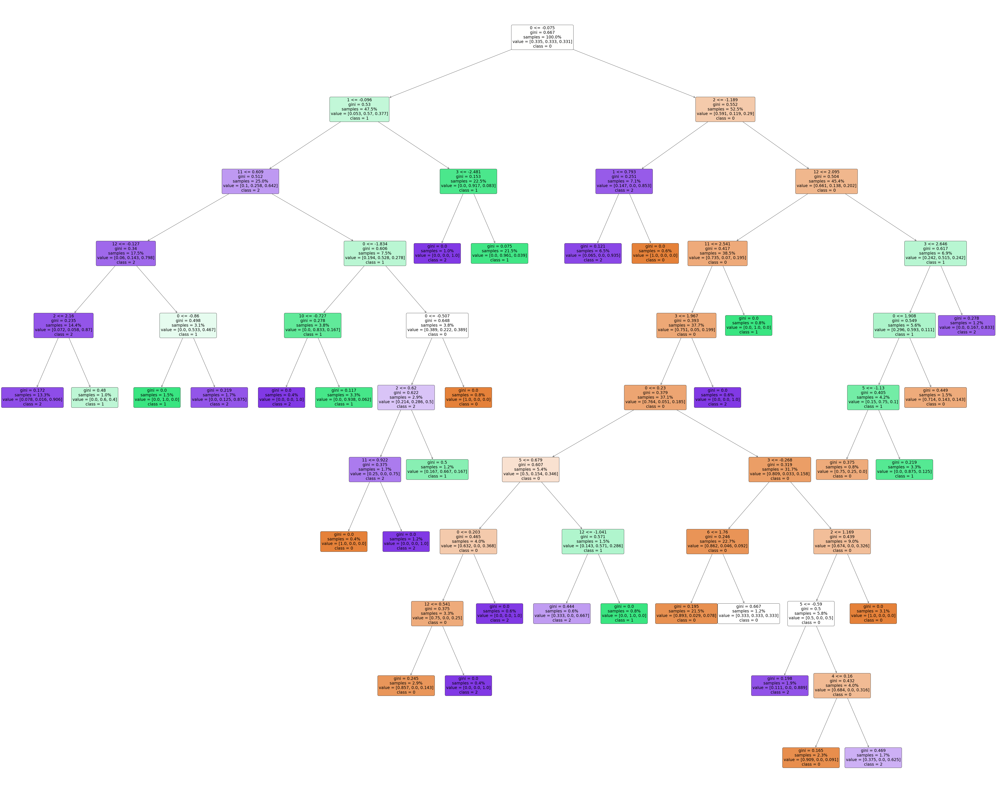

In [39]:
from sklearn.tree import plot_tree
plt.figure(figsize=(100, 80))
plot_tree(dt,
          feature_names=feature_cols,
          class_names=['0','1', '2', '3', '4', '5','6','7'],
          rounded=True, # Rounded node edges
          filled=True, # Adds color accoding to class
          proportion=True)
plt.show()

In [45]:
node_indicator = dt.decision_path(X_test)
leaf_id = dt.apply(X_test)

sample_id = 0
# obtain ids of the nodes `sample_id` goes through, i.e., row `sample_id`
node_index = node_indicator.indices[
    node_indicator.indptr[sample_id] : node_indicator.indptr[sample_id + 1]
]

print("Rules used to predict sample {id}:\n".format(id=sample_id))
for node_id in node_index:
    # continue to the next node if it is a leaf node
    if leaf_id[sample_id] == node_id:
        continue

    # check if value of the split feature for sample 0 is below threshold
    if X_test.iloc[sample_id, feature[node_id]] <= threshold[node_id]:
        threshold_sign = "<="
    else:
        threshold_sign = ">"

    print(
        "decision node {node} : (X_test[{sample}, {feature}] = {value}) "
        "{inequality} {threshold})".format(
            node=node_id,
            sample=sample_id,
            feature=feature[node_id],
            value=X_test[sample_id, feature[node_id]],
            inequality=threshold_sign,
            threshold=threshold[node_id],
        )
    )

Rules used to predict sample 0:



KeyError: (0, 0)

## Feature Importance

<Axes: >

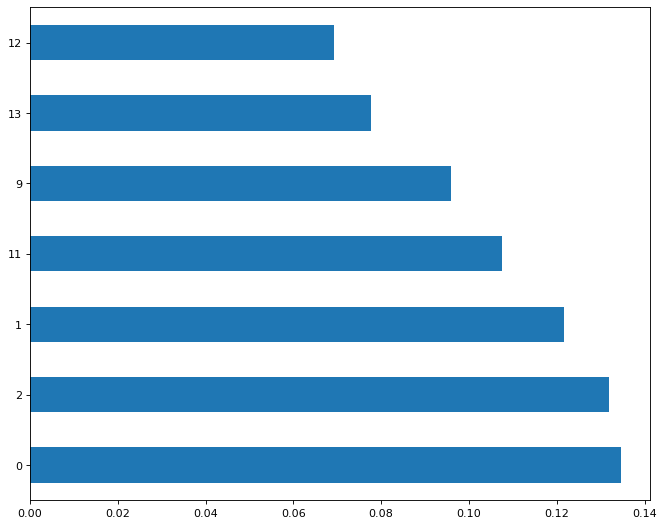

In [95]:


plt.figure(num=None, figsize=(10,8), dpi=80, facecolor='w', edgecolor='k')

feat_importances = pd.Series(rf.feature_importances_, index= feature_cols)

feat_importances.nlargest(7).plot(kind='barh')

## Shapley Values

In [106]:
import shap
# Create object that can calculate shap values
explainer = shap.TreeExplainer(rf)

# Calculate Shap values
shap_values = explainer.shap_values(X_train)

In [122]:

shap.force_plot(explainer.expected_value[1], shap_values[1], X_train, feature_cols)

## Partial Dependence Plots of Shap Values

In [123]:
from pdpbox.pdp import pdp_isolate, pdp_interact, pdp_interact_plot, pdp_plot

In [124]:
X_test = pd.DataFrame(X_test, columns=feature_cols)

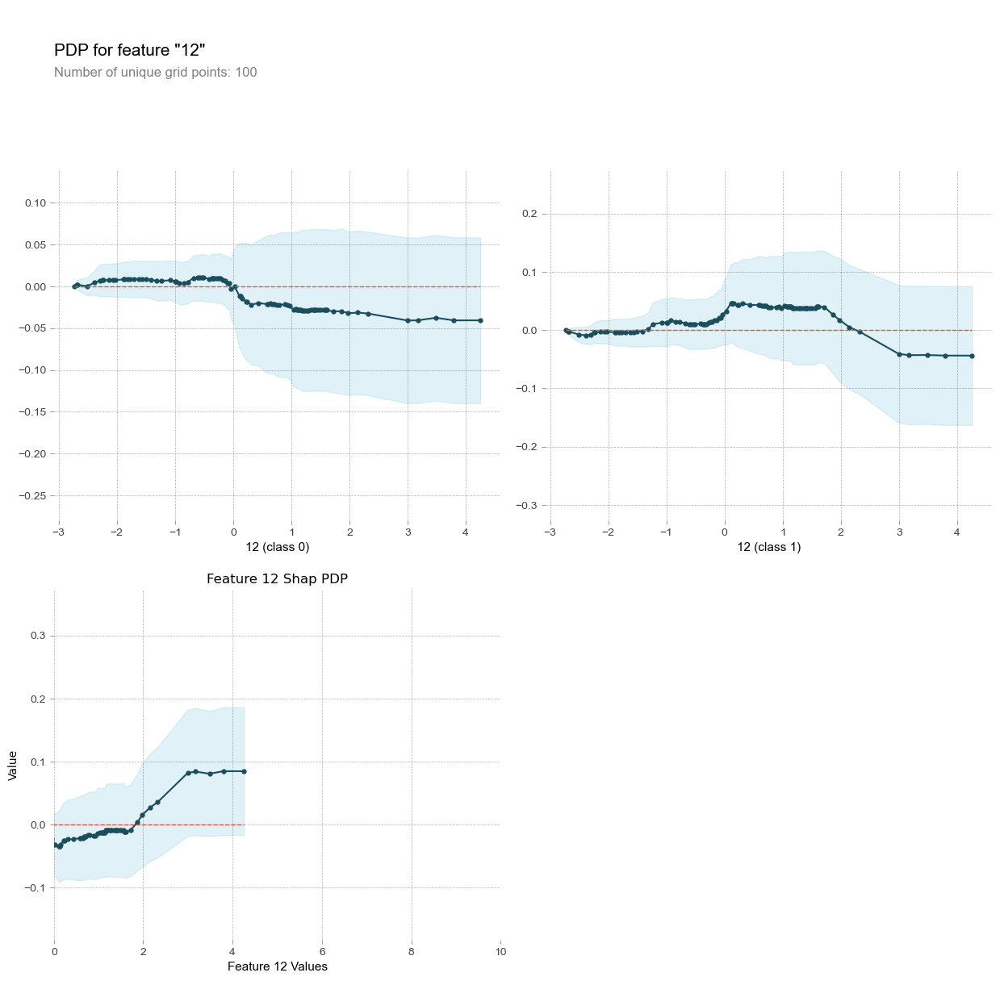

In [127]:
pdp(12, X_test, rf, title='Feature 12 Shap PDP', ylabel='Value', xlabel='Feature 12 Values')